# Generative Adversarial Networks

## Loading Libraries

In [3]:
# Numerical Computing
import numpy as np

# Data Manipulation
import pandas as pd

# Data Visualization
import seaborn as sns
import matplotlib
import matplotlib_inline
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import matplotlib.patches as patches

# Dataset's Iteration Performance
from tqdm import tqdm

# Time
import time

# OS
import re
import sys
import json
import string
import unicodedata
from glob import glob
from io import BytesIO
from imageio import imread
from zipfile import ZipFile
import requests, zipfile, io
from urllib.request import urlopen



# SciPy
from scipy.signal import convolve

# PyTorch
import torch
import torchvision
import torch.nn as nn
from torch.utils.data import *
from torchvision.ops import nms
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator


# IDLMAM Libraries
from idlmam import moveTo, run_epoch, set_seed, View
from idlmam import train_simple_network, set_seed, Flatten, weight_reset, train_network
from idlmam import LanguageNameDataset, pad_and_pack, EmbeddingPackable, LastTimeStep, LambdaLayer


# Scikit-Learn
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

#  IPython Display
from IPython.display import Latex
from IPython.display import display_pdf
from IPython.display import set_matplotlib_formats

/shared-libs/python3.10/py/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Visualization Set-Up

In [4]:
%matplotlib inline

matplotlib_inline.backend_inline.set_matplotlib_formats('png', 'pdf')

### Setting Seeds

In [5]:
torch.backends.cudnn.deterministic=True

set_seed(42)

In [6]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

## Understanding Generative Adversarial Networks

### First GAN Implementation

Hyperparameters

In [7]:
# Batch Size
batch_size = 128

# Latent Dimension
latent_d = 128

# Neurons
neurons = 512

# Output Shape
out_shape = (-1, 28, 28) 

# Epochs
num_epochs = 10

def fcLayer(in_neurons, out_neurons, leak=0.1): 
    return nn.Sequential(
        nn.Linear(in_neurons, out_neurons),
        nn.LeakyReLU(leak),
        nn.LayerNorm(out_neurons)
    )

Defining The D & G Networks

In [8]:
def simpleGAN(latent_d, neurons, out_shape, sigmoidG=False, leak=0.2):
    G = nn.Sequential(
        fcLayer(latent_d, neurons, leak),
        fcLayer(neurons, neurons, leak),
        fcLayer(neurons, neurons, leak),
        nn.Linear(neurons, abs(np.prod(out_shape)) ),
        View(out_shape)
    )

    if sigmoidG:
        G = nn.Sequential(G, nn.Sigmoid())
    
    D = nn.Sequential(
        nn.Flatten(),
        fcLayer(abs(np.prod(out_shape)), neurons, leak),
        fcLayer(neurons, neurons, leak),
        fcLayer(neurons, neurons, leak),
        nn.Linear(neurons, 1 ) 
    )
    return G, D

In [9]:
G, D = simpleGAN(latent_d, neurons, out_shape, sigmoidG=True)

Implementing The GAN Training Loop

In [11]:
G.to(device)
D.to(device)

# Initialize BCEWithLogitsLoss function. 
#The BCE loss is for binary classification problems, which ours is (real vs fake)
loss_func = nn.BCEWithLogitsLoss()

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam Optimizers for both G and D
optimizerD = torch.optim.AdamW(D.parameters(), lr=0.0001, betas=(0.0, 0.9))
optimizerG = torch.optim.AdamW(G.parameters(), lr=0.0001, betas=(0.0, 0.9))

In [12]:
# Training Set
train_data = torchvision.datasets.MNIST("./", train=True, transform=transforms.ToTensor(), download=True)

# Test Set
test_data = torchvision.datasets.MNIST("./", train=False, transform=transforms.ToTensor(), download=True)

# Training & Test Loaders
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, drop_last=True)

test_loader = DataLoader(test_data, batch_size=batch_size)

Failed to download (trying next):
HTTP Error 403: Forbidden

100%|██████████| 9912422/9912422 [00:00<00:00, 106178313.29it/s]
Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden

100%|██████████| 28881/28881 [00:00<00:00, 26693630.19it/s]
Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden

100%|██████████| 1648877/1648877 [00:00<00:00, 118226428.65it/s]
Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden

100%|██████████| 4542/4542 [00:00<00:00, 5106011.46it/s]
Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [13]:
G_losses = []
D_losses = []

for epoch in tqdm(range(num_epochs)):
    for data, class_label in tqdm(train_loader, leave=False):
        real_data = data.to(device)
        y_real = torch.full((batch_size,1), real_label, dtype=torch.float32, device=device)
        y_fake = torch.full((batch_size,1), fake_label, dtype=torch.float32, device=device)
        
        D.zero_grad()

        errD_real = loss_func(D(real_data), y_real)
        errD_real.backward()

        z = torch.randn(batch_size, latent_d, device=device)
        fake = G(z) 
        errD_fake = loss_func(D(fake.detach()), y_fake)
        errD_fake.backward()
        errD = errD_real + errD_fake
        optimizerD.step()

        G.zero_grad()
        errG = loss_func(D(fake), y_real)
        errG.backward()
        optimizerG.step()
        
        G_losses.append(errG.item())
        D_losses.append(errD.item())

100%|██████████| 10/10 [02:35<00:00, 15.60s/it]


Inspecting The Results

In [14]:
with torch.no_grad():
    noise = torch.randn(batch_size, latent_d, device=device) 
    fake_digits = G(noise) 
    scores = torch.sigmoid(D(fake_digits))
    
    fake_digits = fake_digits.cpu()
    scores = scores.cpu().numpy().flatten()

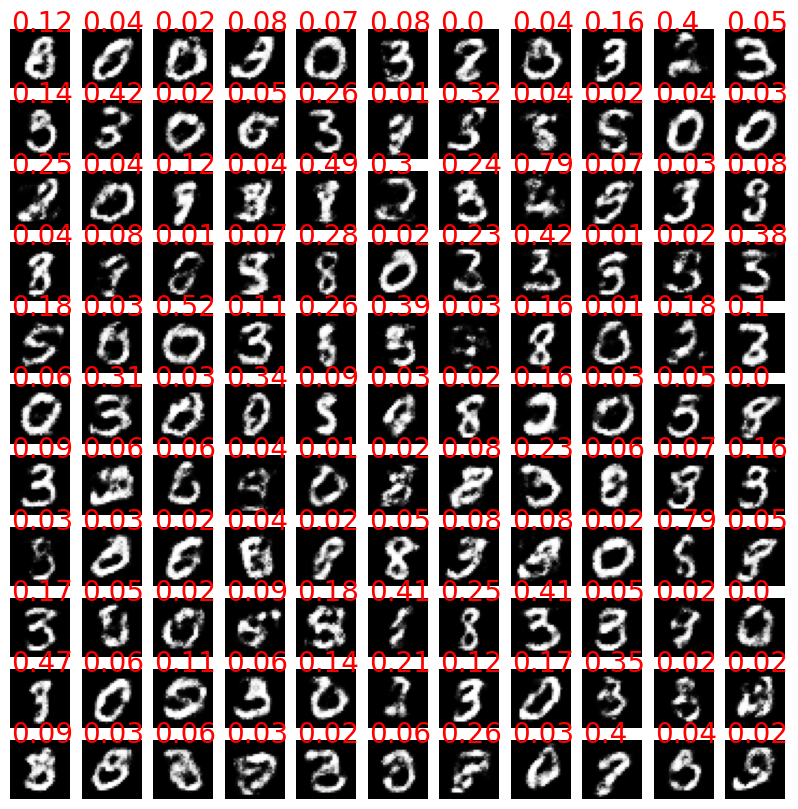

In [15]:
def plot_gen_imgs(fake_digits, scores=None):
    batch_size = fake_digits.size(0)
    fake_digits = fake_digits.reshape(-1, fake_digits.size(-1), fake_digits.size(-1))
    i_max = int(round(np.sqrt(batch_size)))
    j_max = int(np.floor(batch_size/float(i_max)))
    f, axarr = plt.subplots(i_max,j_max, figsize=(10,10))
    for i in range(i_max):
        for j in range(j_max):
            indx = i*j_max+j
            axarr[i,j].imshow(fake_digits[indx,:].numpy(), cmap='gray', vmin=0, vmax=1)
            axarr[i,j].set_axis_off()
            if scores is not None:
                axarr[i,j].text(0.0, 0.5, str(round(scores[indx],2)), dict(size=20, color='red'))

plot_gen_imgs(fake_digits, scores)

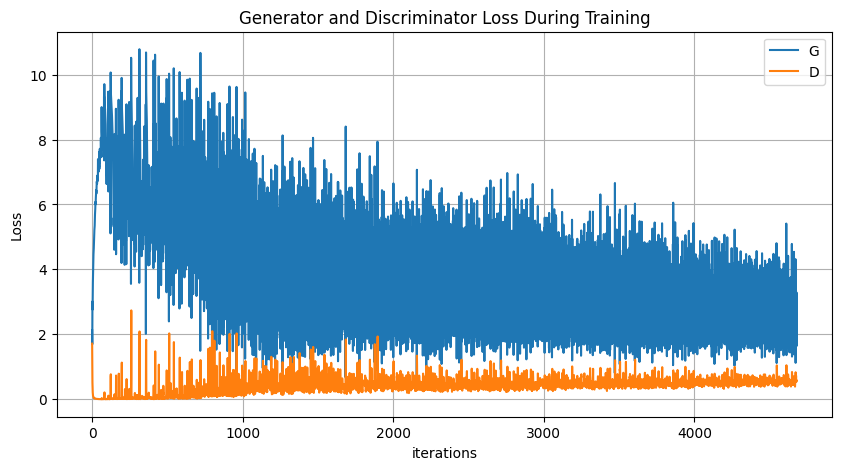

In [16]:
plt.figure(figsize=(10,5))
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.title("Generator and Discriminator Loss During Training")
plt.grid(True)
plt.show()

## Mode Collapse

In [17]:
# Setting Seeds
set_seed(42)

# Grid Size
gausGrid = (3, 3) 

# Grind Sample Size
samples_per = 10000 

In [18]:
X = [] 

for i in range(gausGrid[0]): 
    for j in range(gausGrid[1]): 
        z = np.random.normal(0, 0.05, size=(samples_per, 2)) 
        z[:,0] += i/1.0-(gausGrid[0]-1)/2.0 
        z[:,1] += j/1.0-(gausGrid[1]-1)/2.0 
        X.append(z) 

X = np.vstack(X) 

/tmp/ipykernel_36/2865315690.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=X[:,0], y=X[:,1], shade=True, fill=True, thresh=-0.001)


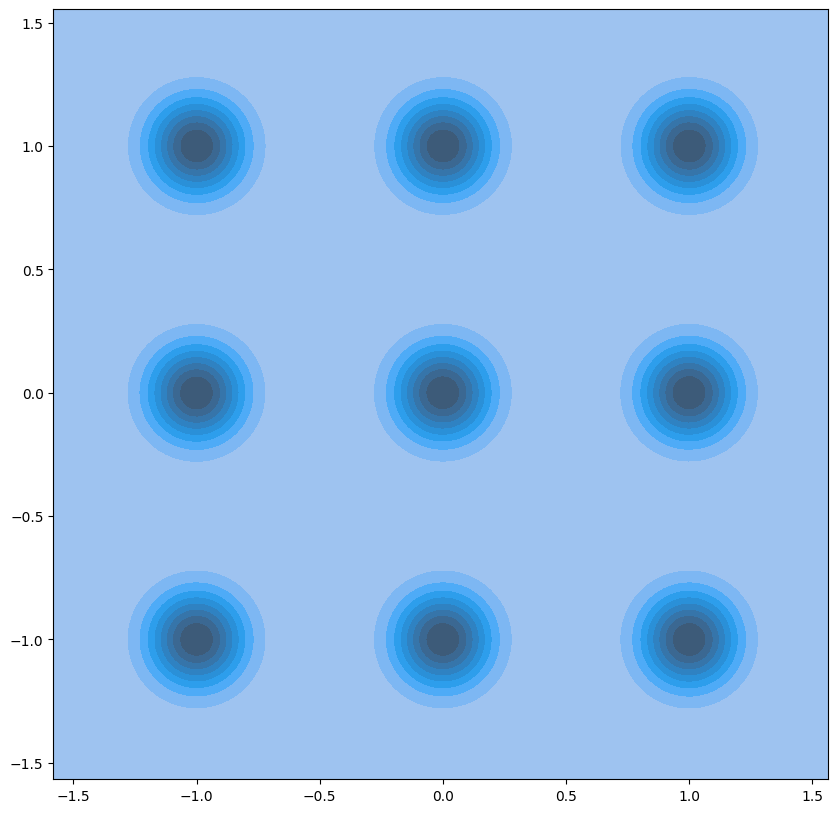

In [19]:
plt.figure(figsize=(10,10))
# Kernel Density Estimation (KDE)
sns.kdeplot(x=X[:,0], y=X[:,1], shade=True, fill=True, thresh=-0.001) 
plt.show()

In [20]:
# Dataset
toy_dataset = torch.utils.data.TensorDataset(torch.tensor(X, dtype=torch.float32))

# Data Loader
toy_loader = DataLoader(toy_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

#
latent_d = 64

# Two Outputs GAN
G, D = simpleGAN(latent_d, 512, (-1, 2)) 

In [21]:
G.to(device)
D.to(device)

# G& D Adam's Optimizers 
optimizerD = torch.optim.AdamW(D.parameters(), lr=0.0001, betas=(0.0, 0.9))
optimizerG = torch.optim.AdamW(G.parameters(), lr=0.0001, betas=(0.0, 0.9))

In [22]:
for epoch in tqdm(range(20)):
    for i, (data,) in enumerate(tqdm(toy_loader, leave=False), 0):
        real_data = data.to(device)
        y_real = torch.full((batch_size,1), real_label, dtype=torch.float32, device=device)
        y_fake = torch.full((batch_size,1), fake_label, dtype=torch.float32, device=device)
        
        D.zero_grad()

        errD_real = loss_func(D(real_data), y_real)
        errD_real.backward()

        z = torch.randn(batch_size, latent_d, device=device)
        fake = G(z) 
        errD_fake = loss_func(D(fake.detach()), y_fake)
        errD_fake.backward()
        errD = errD_real + errD_fake
        optimizerD.step()

        G.zero_grad()
        errG = loss_func(D(fake), y_real)
        errG.backward()
        optimizerG.step()
        
        G_losses.append(errG.item())
        D_losses.append(errD.item())

100%|██████████| 20/20 [03:10<00:00,  9.51s/it]


In [23]:
with torch.no_grad():
    noise = torch.randn(X.shape[0], latent_d, device=device) 
    fake_samples = G(noise).cpu().numpy() 

<function matplotlib.pyplot.show(close=None, block=None)>

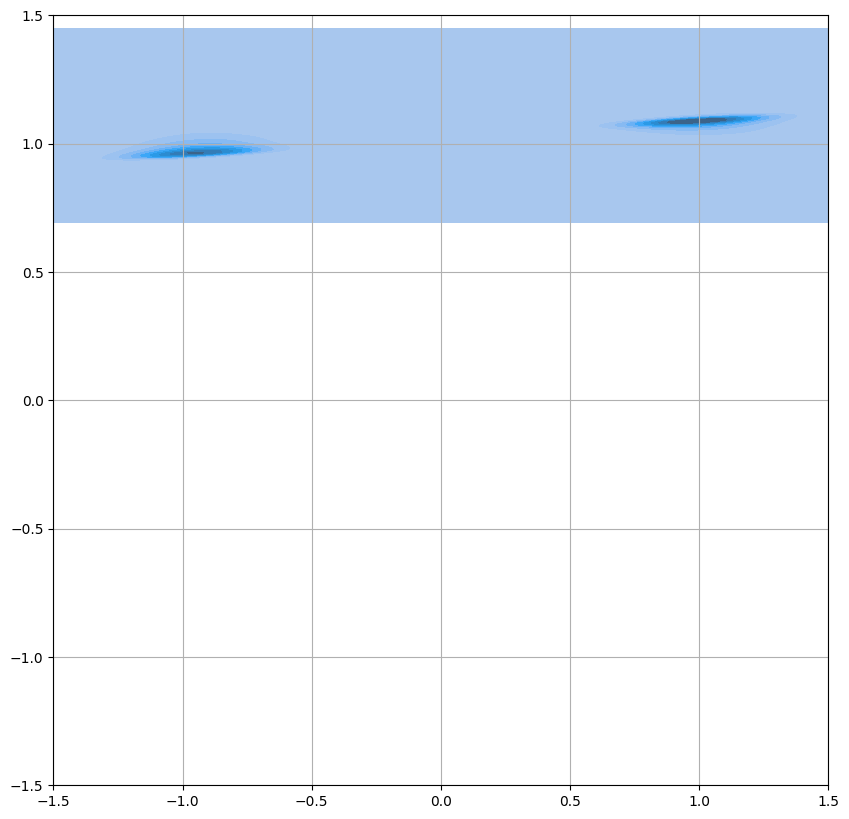

In [28]:
plt.figure(figsize=(10,10))
sns.kdeplot(x=fake_samples[:,0], y=fake_samples[:,1], fill=True, thresh=-0.001) 
plt.xlim(-1.5, 1.5) 
plt.ylim(-1.5, 1.5)
plt.grid(True)
plt.show

## Wasserstein GAN: Mitigating Mode Collapse

### Implementing WGAN

Updating The Training Prep

In [29]:
def train_wgan(D, G, loader, latent_d, epochs=20, d_updates=1, device="cpu"):
    G_losses = []
    D_losses = []

    G.to(device)
    D.to(device)

    optimizerD = torch.optim.AdamW(D.parameters(), lr=0.0001, betas=(0.0, 0.9))
    optimizerG = torch.optim.AdamW(G.parameters(), lr=0.0001, betas=(0.0, 0.9))

    for epoch in tqdm(range(epochs)):
        for count, data in enumerate(tqdm(loader, leave=False)):
            if isinstance(data, tuple) or len(data) == 2:
                data, class_label = data
            elif isinstance(data, list) and len(data) == 1:
                data = data[0]
            batch_size = data.size(0)
            real = data.to(device)
            
            D.zero_grad()
            G.zero_grad()

            D_success = D(real)

            noise = torch.randn(batch_size, latent_d, device=device)
            fake = G(noise) 
            D_failure = D(fake) 

            eps_shape = [batch_size]+[1]*(len(data.shape)-1)
            eps = torch.rand(eps_shape, device=device)
            fake = eps*real + (1-eps)*fake
            output = D(fake) 

            grad = torch.autograd.grad(outputs=output, inputs=fake,
                                  grad_outputs=torch.ones(output.size(), device=device),
                                  create_graph=True, retain_graph=True, only_inputs=True, allow_unused=True)[0]

            D_grad_penalty = ((grad.norm(2, dim=1) - 1) ** 2).mean()

            errD = (D_failure-D_success).mean() + D_grad_penalty.mean()*10
            errD.backward()
            optimizerD.step()
            
            D_losses.append(errD.item())

            if count % d_updates != d_updates-1:
                continue
            
            D.zero_grad()
            G.zero_grad()

            noise = torch.randn(batch_size, latent_d, device=device)
            output = -D(G(noise))
            errG = output.mean()
            errG.backward()
            optimizerG.step()
            
            G_losses.append(errG.item())
            
    return D_losses, G_losses

In [30]:
G, D = simpleGAN(latent_d, 512, (-1, 2))

train_wgan(D, G, toy_loader, latent_d, epochs=20, device=device)

G, D = G.eval(), D.eval()

100%|██████████| 20/20 [04:42<00:00, 14.10s/it]


Results with Less Mode Collapse

/tmp/ipykernel_36/3732446103.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  ax = sns.kdeplot(x=fake_samples_w[:,0], y=fake_samples_w[:,1], shade=True, thresh=-0.001)


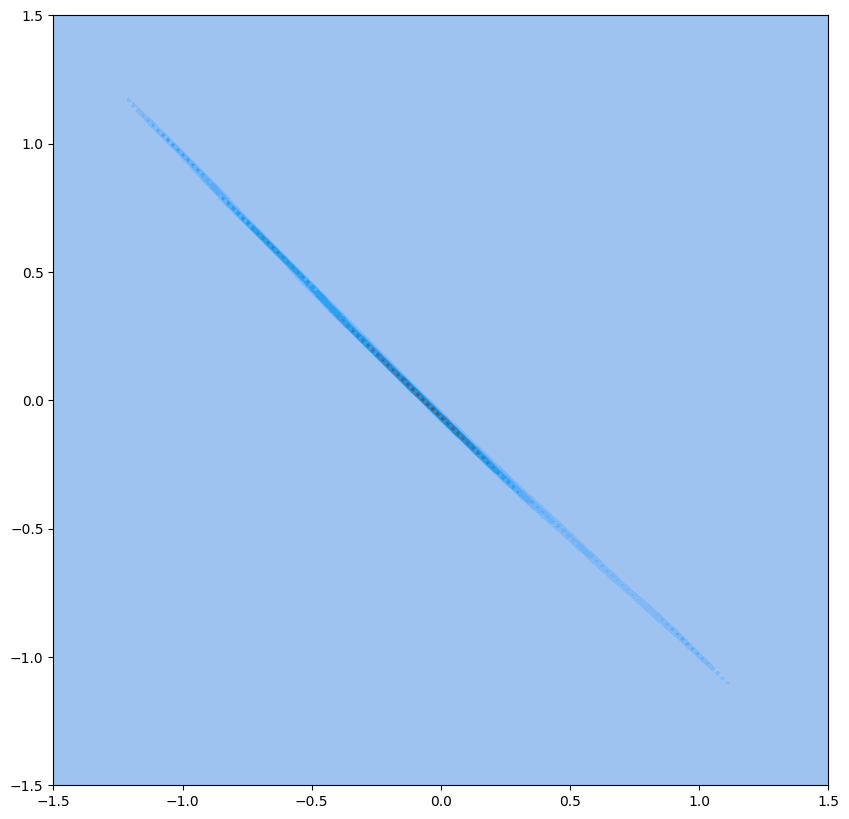

In [31]:
with torch.no_grad():
    noise = torch.randn(X.shape[0], latent_d, device=device)
    fake_samples_w = G(noise).cpu().numpy()

plt.figure(figsize=(10,10))
ax = sns.kdeplot(x=fake_samples_w[:,0], y=fake_samples_w[:,1], shade=True, thresh=-0.001)
plt.xlim(-1.5, 1.5)
plt.ylim(-1.5, 1.5)
plt.show()

In [32]:
latent_d = 128
out_shape = (-1, 1, 28, 28)
G, D = simpleGAN(latent_d, neurons, out_shape, sigmoidG=True)

D_losses, G_losses = train_wgan(D, G, train_loader, latent_d, epochs=40, device=device)

G = G.eval()
D = D.eval()

100%|██████████| 40/40 [12:37<00:00, 18.93s/it]


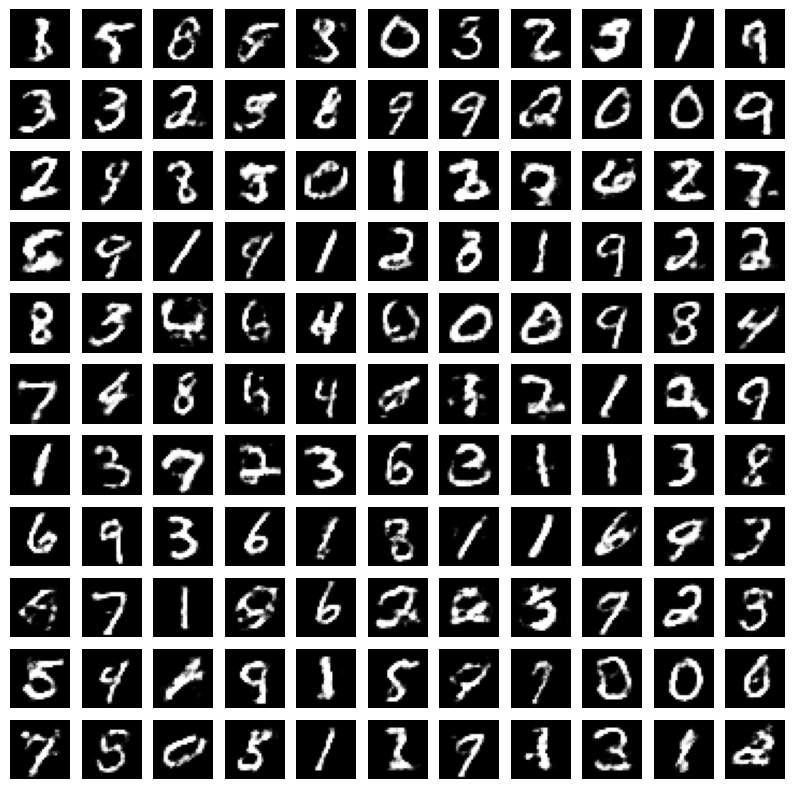

In [33]:
with torch.no_grad():
    noise = torch.randn(batch_size, latent_d, device=device)
    fake_digits = G(noise)
    scores = D(fake_digits)
    
    fake_digits = fake_digits.cpu()
    scores = scores.cpu().numpy().flatten()

plot_gen_imgs(fake_digits)

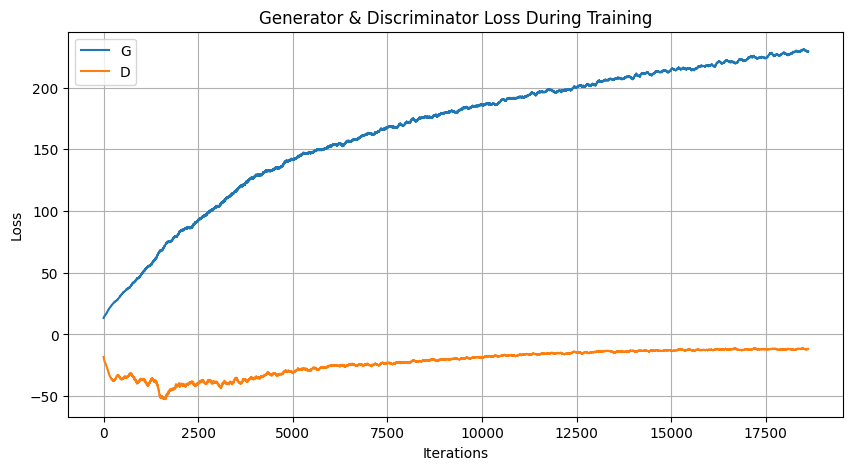

In [34]:
plt.figure(figsize=(10,5))
plt.title("Generator & Discriminator Loss During Training")
plt.plot(np.convolve(G_losses, np.ones((100,))/100, mode='valid') ,label="G")
plt.plot(np.convolve(D_losses, np.ones((100,))/100, mode='valid') ,label="D")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.show()

## Convolutional GAN

### Designing a Convolutional Generator

In [35]:
# Setting Seeds
set_seed(42)

# Starting Size
start_size = 28//4  

# Latent Space
latent_channels = 16

# Latent Space Needed
latent_d_conv = latent_channels*(start_size**2) 

# Input Shape
in_shape = (-1, latent_channels, start_size, start_size )

Implementing Convolutional Helper Functions

In [36]:
# Latent Space Channels
n_filters = 32 

# Kernel Size
k_size= 5 

# Transposed Kernel Size
k_size_t = 4 #default kernel size for transposed convolutions

# Leaky ReLU
leak = 0.2 

# Hidden Conv Layer Helper function 
def cnnLayer(in_channels, out_channels, filter_size, wh_size, leak=0.2):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, filter_size, padding=filter_size//2), 
        nn.LeakyReLU(leak),
        nn.LayerNorm([out_channels, wh_size, wh_size]),
    )

# Transposed Conv Layer Helper Function
def tcnnLayer(in_channels, out_channels, wh_size, leak=0.2):
    return nn.Sequential(
        nn.ConvTranspose2d(in_channels, out_channels, k_size_t, padding=1, output_padding=0, stride=2), 
        nn.LeakyReLU(leak),
        nn.LayerNorm([out_channels, wh_size, wh_size]),
    )

In [37]:
# GAN CNN Generatior 
G = nn.Sequential(
    View(in_shape),
    cnnLayer(latent_channels, n_filters, k_size, 28//4, leak),
    cnnLayer(n_filters, n_filters, k_size, 28//4, leak),
    cnnLayer(n_filters, n_filters, k_size, 28//4, leak),
    tcnnLayer(n_filters, n_filters//2, 28//2, leak),
    cnnLayer(n_filters//2, n_filters//2, k_size, 28//2, leak),
    cnnLayer(n_filters//2, n_filters//2, k_size, 28//2, leak),
    tcnnLayer(n_filters//2, n_filters//4, 28, leak),
    cnnLayer(n_filters//4, n_filters//4, k_size, 28, leak),
    cnnLayer(n_filters//4, n_filters//4, k_size, 28, leak),
    nn.Conv2d(n_filters//4, 1, k_size, padding=k_size//2), 
    nn.Sigmoid(),
)

### Designing a Convolutional Discriminator

In [38]:
# GAN CNN Discriminator
D = nn.Sequential(
    cnnLayer(1, n_filters, k_size, 28, leak),
    cnnLayer(n_filters, n_filters, k_size, 28, leak),
    nn.AvgPool2d(2), 
    cnnLayer(n_filters, n_filters, k_size, 28//2, leak),
    cnnLayer(n_filters, n_filters, k_size, 28//2, leak),
    nn.AvgPool2d(2),
    cnnLayer(n_filters, n_filters, 3, 28//4, leak),
    cnnLayer(n_filters, n_filters, 3, 28//4, leak),
    nn.AdaptiveAvgPool2d(4),
    nn.Flatten(),
    nn.Linear(n_filters*4**2,256),
    nn.LeakyReLU(leak),
    nn.Linear(256,1),
)

Training & Inspecting our Convolutional GAN

In [39]:
D_losses, G_losses = train_wgan(D, G, train_loader, latent_d_conv, epochs=15, device=device)

G = G.eval()
D = D.eval()

100%|██████████| 15/15 [39:47<00:00, 159.14s/it]


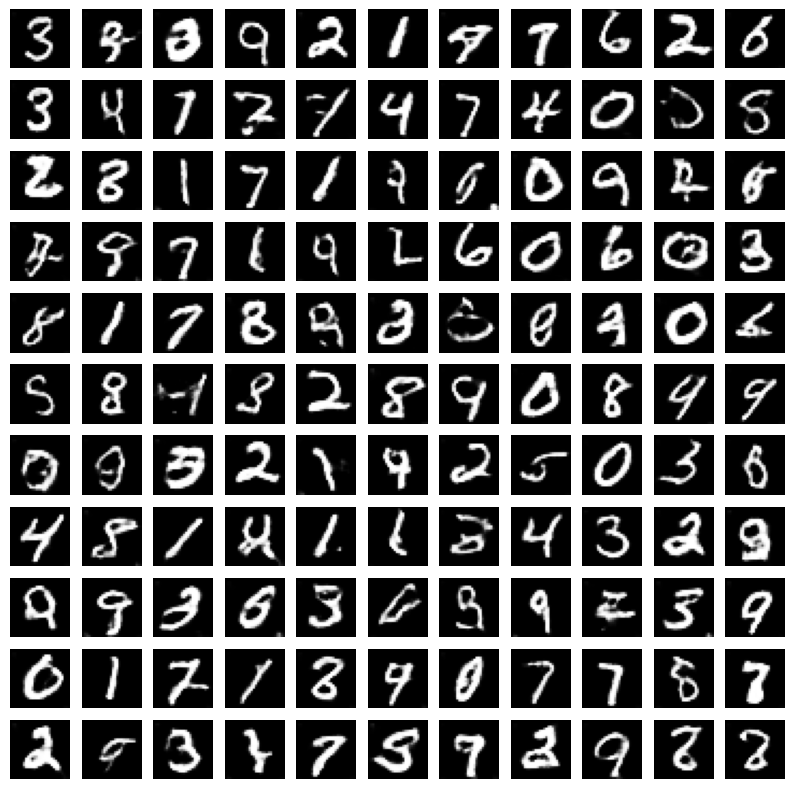

In [40]:
with torch.no_grad():
    noise = torch.randn(batch_size, latent_d_conv, device=device)
    fake_digits = G(noise)
    scores = D(fake_digits)
    
    fake_digits = fake_digits.cpu()
    scores = scores.cpu().numpy().flatten()

plot_gen_imgs(fake_digits)

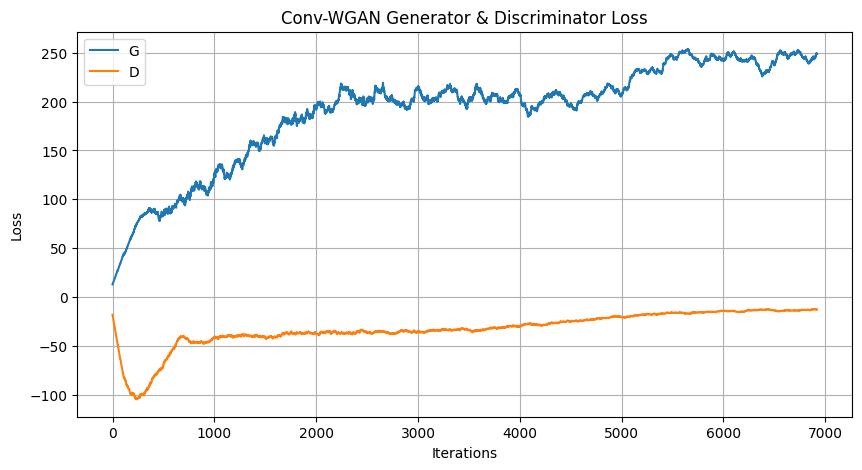

In [41]:
plt.figure(figsize=(10,5))
plt.title("Conv-WGAN Generator & Discriminator Loss")
plt.plot(np.convolve(G_losses, np.ones((100,))/100, mode='valid') ,label="G")
plt.plot(np.convolve(D_losses, np.ones((100,))/100, mode='valid') ,label="D")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.show()

## Conditional GAN

### Implementing a Conditional GAN

In [42]:
# Setting Seeds
set_seed(42)

class ConditionalWrapper(nn.Module):
    def __init__(self, input_shape, neurons, classes, main_network, leak=0.2):
        super().__init__()
        
        self.input_shape = input_shape
        self.classes = classes
        input_size = abs(np.prod(input_shape))
        self.label_embedding = nn.Embedding(classes, input_size)
        
        self.combiner = nn.Sequential(
            nn.Flatten(),
            fcLayer(input_size*2, input_size, leak=leak),
            nn.Linear(input_size, input_size),
            nn.LeakyReLU(leak),
            View(input_shape), 
            nn.LayerNorm(input_shape[1:]),
        )
        self.net = main_network
        
    def forward(self, x, condition=None):
        if condition is None:
            condition = torch.randint(0, self.classes, size=(x.size(0),), device=x.get_device()) 
        embd = self.label_embedding(condition)
        embd = embd.view(self.input_shape)
        x = x.view(self.input_shape)
        x_comb = torch.cat([x, embd], dim=1)
        return self.net(self.combiner(x_comb))

### Training a Conditional GAN

In [43]:
latent_d = 128
out_shape = (-1, 1, 28, 28)
in_shape = (-1, latent_d)
classes = 10
G, D = simpleGAN(latent_d, neurons, out_shape, sigmoidG=True)

G = ConditionalWrapper(in_shape, neurons, classes, G)
D = ConditionalWrapper(out_shape, neurons, classes, D)

### Controlling The Generation with Conditional GAN's

In [44]:
def train_c_wgan(D, G, loader, latent_d, epochs=20, device="cpu"):
    G_losses = []
    D_losses = []

    G = G.to(device)
    D = D.to(device)

    optimizerD = torch.optim.AdamW(D.parameters(), lr=0.0001, betas=(0.0, 0.9))
    optimizerG = torch.optim.AdamW(G.parameters(), lr=0.0001, betas=(0.0, 0.9))

    for epoch in tqdm(range(epochs)):
        for data in tqdm(loader, leave=False):
            if isinstance(data, tuple) or len(data) == 2:
                data, class_label = data
            batch_size = data.size(0)
            D.zero_grad()
            G.zero_grad()
            real = data.to(device)
            class_label = class_label.to(device)
            D_success = D(real, class_label)

            noise = torch.randn(batch_size, latent_d, device=device)
            fake = G(noise, class_label) 
            D_failure = D(fake, class_label) 

            eps_shape = [batch_size]+[1]*(len(data.shape)-1)
            eps = torch.rand(eps_shape, device=device)
            fake = eps*real + (1-eps)*fake
            output = D(fake, class_label) 

            grad = torch.autograd.grad(outputs=output, inputs=fake,
                                  grad_outputs=torch.ones(output.size(), device=device),
                                  create_graph=True, retain_graph=True, only_inputs=True, allow_unused=True)[0]

            D_grad_penalty = ((grad.norm(2, dim=1) - 1) ** 2).mean() 

            errD = (D_failure-D_success).mean() + D_grad_penalty.mean()*10
            errD.backward()
            optimizerD.step()
            
            D_losses.append(errD.item())

            D.zero_grad()
            G.zero_grad()

            noise = torch.randn(batch_size, latent_d, device=device)
            output = -D(G(noise, class_label), class_label)
            errG = output.mean()
            errG.backward()
            optimizerG.step()
            
            G_losses.append(errG.item())
            
    return D_losses, G_losses

In [45]:
D_losses, G_losses = train_c_wgan(D, G, train_loader, latent_d, epochs=20, device=device)

G = G.eval()
D = D.eval()

100%|██████████| 20/20 [08:52<00:00, 26.61s/it]


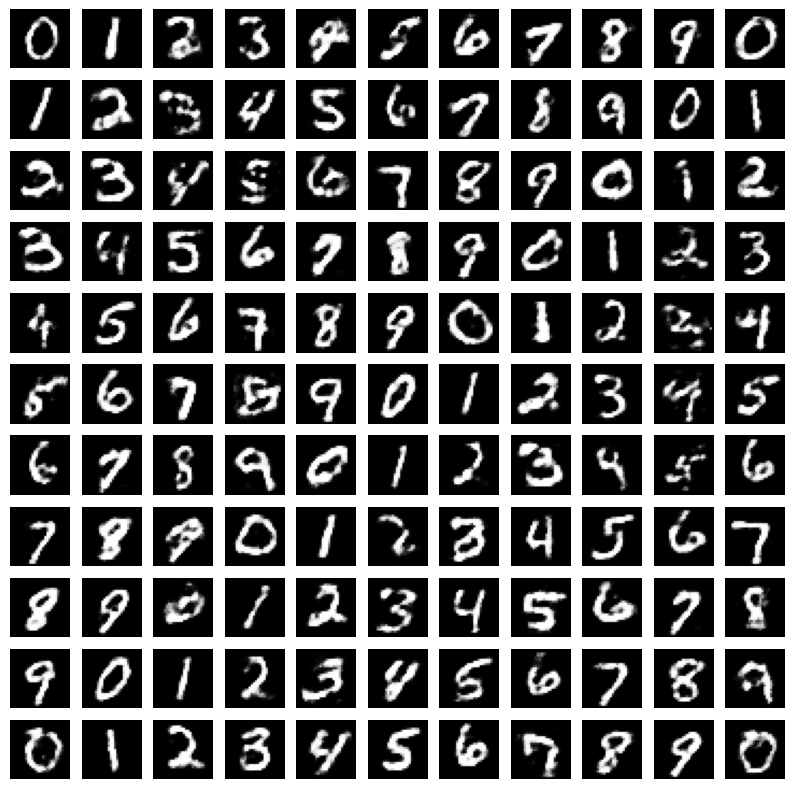

In [46]:
with torch.no_grad():
    noise =  torch.randn(batch_size, latent_d, device=device) 
    labels = torch.fmod(torch.arange(0, batch_size, device=device), classes) 
    fake_digits = G(noise, labels)
    scores = D(fake_digits, labels)
    
    fake_digits = fake_digits.cpu()
    scores = scores.cpu().numpy().flatten()

plot_gen_imgs(fake_digits)

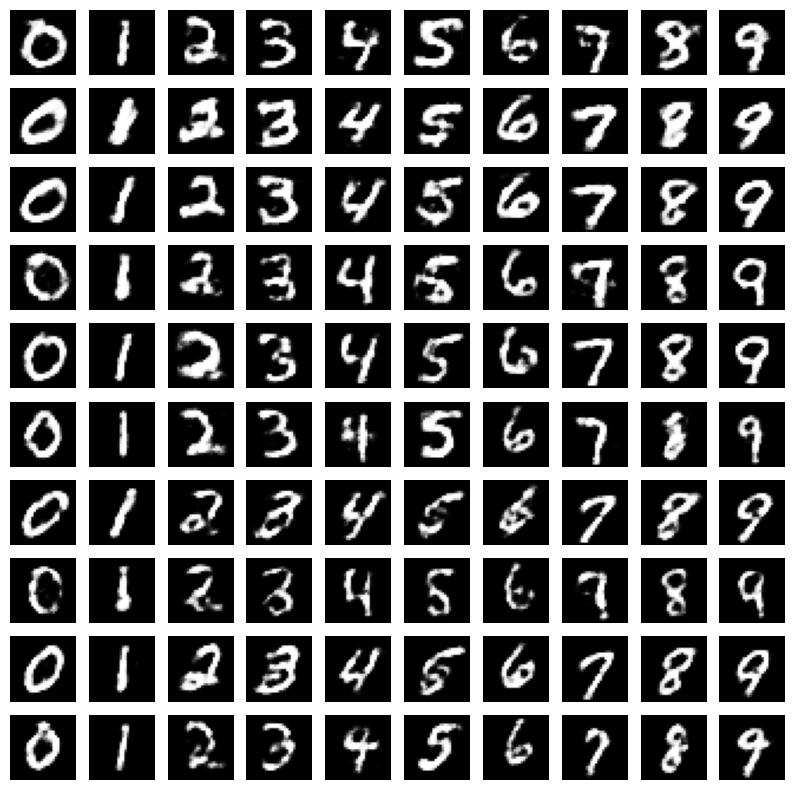

In [47]:
with torch.no_grad():
    noise =  torch.randn(10, latent_d, device=device).repeat((1,10)).view(-1, latent_d)
    labels = torch.fmod(torch.arange(0, noise.size(0), device=device), classes)
    fake_digits = G(noise, labels)
    scores = D(fake_digits, labels)
    
    fake_digits = fake_digits.cpu()
    scores = scores.cpu().numpy().flatten()

plot_gen_imgs(fake_digits)

## Walking The Latent Space of GANs

In [48]:
model = torch.hub.load('facebookresearch/pytorch_GAN_zoo:hub', 
'PGAN', 
model_name='celebAHQ-512', 
pretrained=True, 
useGPU=False)

Downloading: "https://github.com/facebookresearch/pytorch_GAN_zoo/zipball/hub" to /root/.cache/torch/hub/hub.zip
Downloading: "https://dl.fbaipublicfiles.com/gan_zoo/PGAN/celebaHQ16_december_s7_i96000-9c72988c.pth" to /root/.cache/torch/hub/checkpoints/celebaHQ16_december_s7_i96000-9c72988c.pth
100%|██████████| 264M/264M [00:01<00:00, 219MB/s]
Average network found !


In [49]:
set_seed(3)

Specific of The PGAN HUB Model

In [50]:
num_images = 2

noise, _ = model.buildNoiseData(num_images)

with torch.no_grad():
    generated_images = model.test(noise)

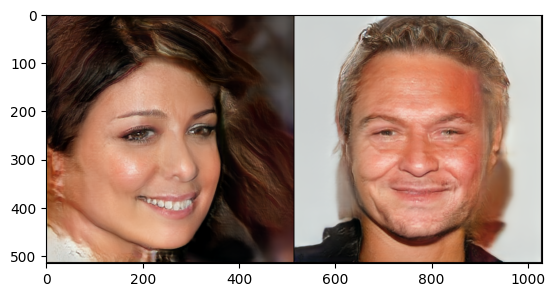

In [51]:
grid = torchvision.utils.make_grid(generated_images.clamp(min=-1, max=1), scale_each=True, normalize=True)

plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
plt.show()

In [52]:
print(noise)

tensor([[-0.0766,  0.3599, -0.7820,  ..., -1.0038,  0.5046, -0.4253],
        [ 0.5643,  0.4867,  0.2295,  ...,  1.1609, -1.2194,  0.8006]])


### Interpolating GAN Output

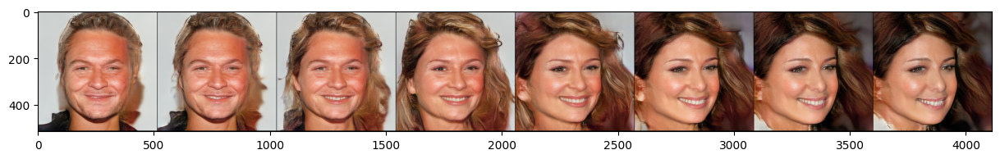

In [53]:
steps = 8

interpolated_z = [] 

for x in torch.arange(0,steps)/float(steps)+0.5/steps:
    z_mix = x*noise[0,:] + (1-x)*noise[1,:]
    interpolated_z.append(z_mix)

with torch.no_grad():
    mixed_g = model.test(torch.stack(interpolated_z)).clamp(min=-1, max=1)

grid = torchvision.utils.make_grid(mixed_g.clamp(min=-1, max=1), scale_each=True, normalize=True)
plt.figure(figsize=(15,10))
plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
plt.show()

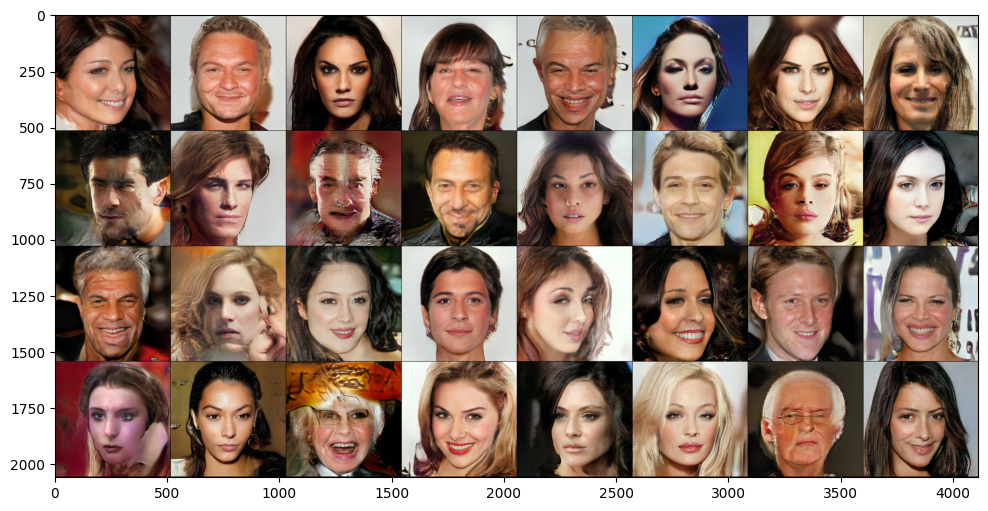

In [54]:
set_seed(3)

noise, _ = model.buildNoiseData(8*4)

with torch.no_grad():
    generated_images = model.test(noise)

grid = torchvision.utils.make_grid(generated_images.clamp(min=-1, max=1), scale_each=True, normalize=True)
plt.figure(figsize=(13,6))
plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
plt.show()

### Labeling Latent Dimensions

In [58]:

male = [0, 1, 0, 0, 1, 0, 0, 0, 
       1, 1, 1, 1, 0, 1, 0, 0, 
       1, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0]
smile = [1, 1, 0, 0, 1, 0, 1, 1,
        0, 0, 0, 0, 0, 1, 0, 0, 
        1, 0, 1, 0, 1, 1, 1, 1,
        0, 0, 1, 1, 0, 0, 0, 1]
male = np.array(male, dtype=bool)
smile = np.array(smile, dtype=bool)

#Converting the shape from (32) to (32, 1)
male = torch.tensor(np.expand_dims(male, axis=-1))
smile = torch.tensor(np.expand_dims(smile, axis=-1))

Calculating a Semantic Vector

In [59]:
def extractVec(labels, noise):
    posVec = torch.sum(noise*labels, axis=0)/torch.sum(labels) 
    negVec = torch.sum(noise*~labels, axis=0)/torch.sum(~labels) 
    return posVec-negVec 

Manipulating Images with Semantic Vectors

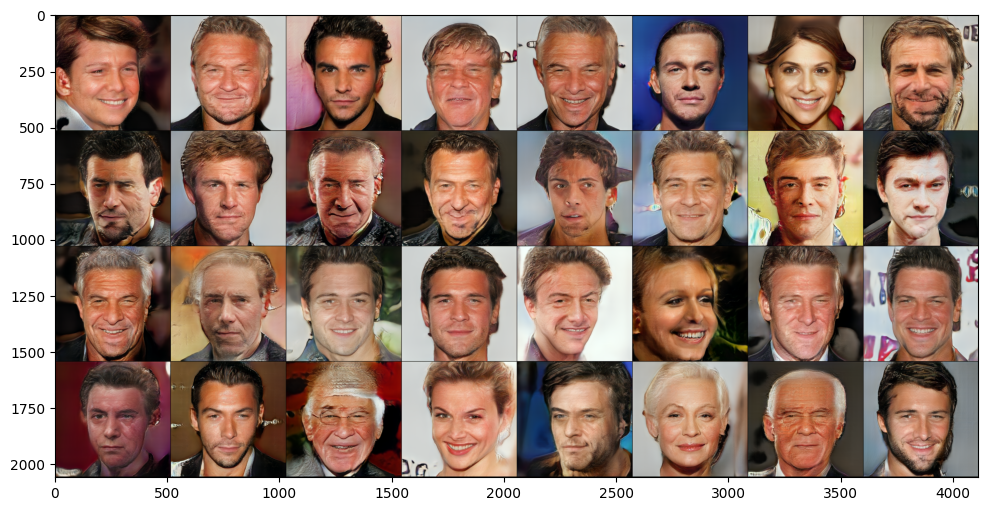

In [60]:
gender_vec = extractVec(male, noise)

with torch.no_grad():
    generated_images = model.test(noise+gender_vec)
#plot the results! 
grid = torchvision.utils.make_grid(generated_images.clamp(min=-1, max=1), scale_each=True, normalize=True)
plt.figure(figsize=(13,6))
plt.imshow(grid.permute(1, 2, 0).cpu().numpy())

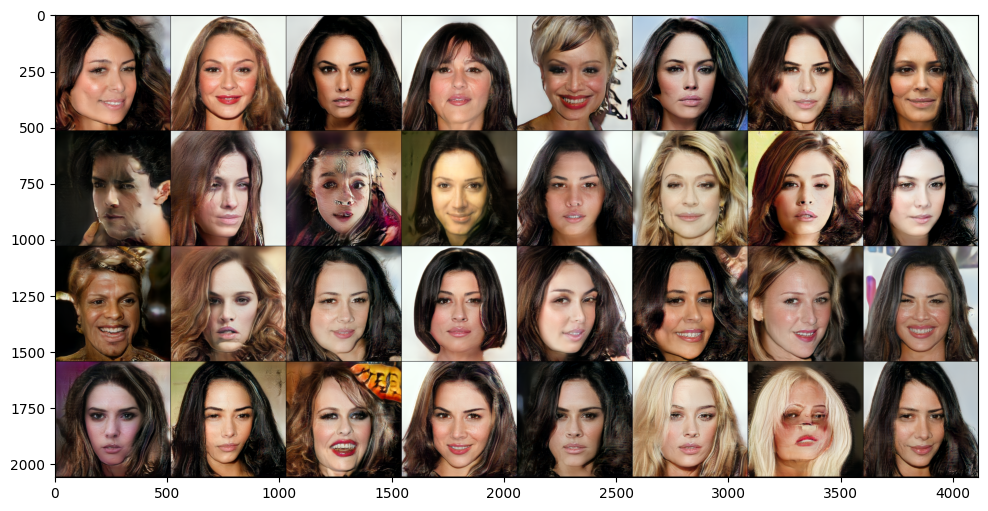

In [63]:
with torch.no_grad():
    generated_images = model.test(noise-gender_vec)
grid = torchvision.utils.make_grid(generated_images.clamp(min=-1, max=1), scale_each=True, normalize=True)

plt.figure(figsize=(13,6))
plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
plt.show()

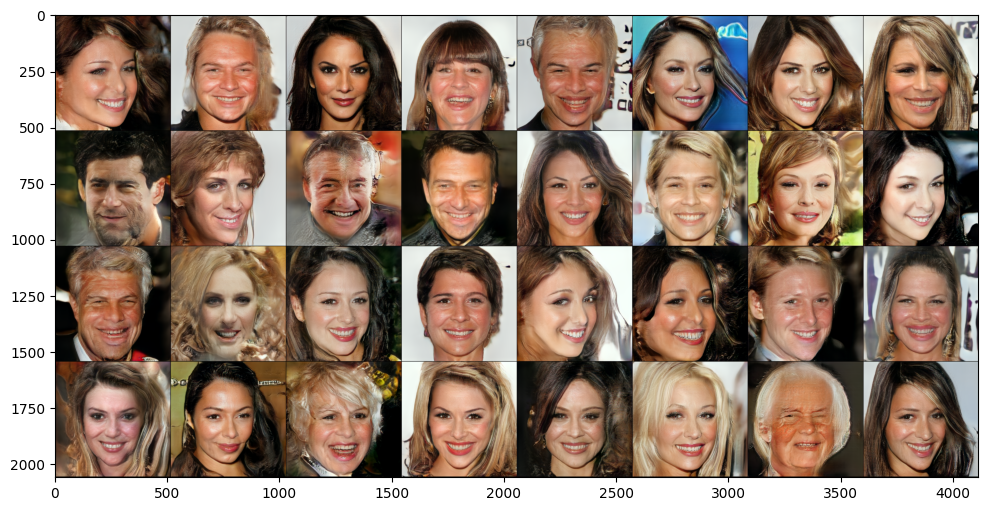

In [64]:
smile_vec = extractVec(smile, noise)

with torch.no_grad():
    generated_images = model.test(noise+smile_vec)
grid = torchvision.utils.make_grid(generated_images.clamp(min=-1, max=1), scale_each=True, normalize=True)
plt.figure(figsize=(13,6))
plt.imshow(grid.permute(1, 2, 0).cpu().numpy())

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=1cad1133-f5e7-475b-a2cd-cfeae2ccc3be' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>